In [1]:
%load_ext autoreload
%autoreload 2
# %matplotlib widget

In [2]:
import sys
sys.path.append('../')

from glob import glob
import torch
from typing import Tuple, List
import clip
from PIL import Image
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from pytorch_metric_learning.distances import CosineSimilarity
from tqdm import tqdm
from explainer import Explainer
from dimensionality_reduction import DimRedRecon

In [3]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
base_model, preprocess = clip.load("ViT-B/32", device=device)

In [4]:
class Model(torch.nn.Module):
    def __init__(self, base_model:torch.nn.Module, dimred_model:torch.nn.Module=None):
        super().__init__()
        self.base_model = base_model
        self.dimred_model = dimred_model

    def forward(self, x):
        x = self.base_model.encode_image(x)
        if self.dimred_model is not None:
            x = self.dimred_model.transform(x)
        return x

In [5]:
# files = glob('../data/cars196/car_ims/*.jpg')
# files = np.random.permutation(files)[:20]
files = ['001541', '010468', '009910', '008400', '015408', '004578', '010189', '009112', '006091', '015126', '005296', '006937', '005803', '014967', '009705', '003320', '006519', '008886', '010343', '008009', '011777', '012899', '008446'] # for reproducibility
files = [f"../data/cars196/car_ims/{f}.jpg" for f in files]

images = [Image.open(f) for f in files]

In [6]:
# Base CLIP
raw_clip = Model(base_model)
clip_explainer = Explainer(model=raw_clip, distance=CosineSimilarity(), transform=preprocess)

In [7]:
num_components = 2

In [8]:
# # Scrapes all car model names from the kbb page
# car_models = pd.read_html("https://www.kbb.com/car-make-model-list/new/view-all/make/")

# manufacturers = car_models[0]["Make"]
# manufacturers = manufacturers.dropna().tolist()
# manufacturers = list(set(manufacturers))

# all_models = car_models[0]["Make"] + " " + car_models[0][".css-1mzj64w-ContentWrapper{margin:10px 24px 10px 0px;}Model"]
# all_models = all_models.dropna().tolist()
# all_models = list(set(all_models))

In [9]:
all_models = torch.load("../data/cars196/all_models_scraped_kbb_2022-08-17.pt")
manufacturers = torch.load("../data/cars196/manufacturers_scraped_kbb_2022-08-17.pt")

In [10]:
# Optimized CLIP

## focus on car model
texts = [f"a photo of a {m}" for m in all_models]

text = clip.tokenize(list(set(texts))).to(device)
with torch.no_grad():
    text_features = base_model.encode_text(text).cpu().detach()
    text_features = text_features / text_features.norm(dim=1, keepdim=True)

dimred_car_model = DimRedRecon(num_components=num_components)

dimred_car_model.fit(text_features)

Loss (455): 0.5725765824317932: : 455it [00:02, 173.67it/s]


Finished optimization. Best loss (0.5725765228271484) achieved after 355 iterations.


In [11]:
car_model_clip = Model(base_model, dimred_model=dimred_car_model)
car_model_clip_explainer = Explainer(model=car_model_clip, distance=CosineSimilarity(), transform=preprocess)

In [12]:
# Optimized CLIP

## focus on car manufacturer
texts = [f"a photo of a car produced by {m}" for m in manufacturers]

text = clip.tokenize(list(set(texts))).to(device)
with torch.no_grad():
    text_features = base_model.encode_text(text).cpu().detach()
    text_features = text_features / text_features.norm(dim=1, keepdim=True)

dimred_manufacturer = DimRedRecon(num_components=num_components)

dimred_manufacturer.fit(text_features)

Loss (1353): 0.3565119802951813: : 1353it [00:04, 322.03it/s] 

Finished optimization. Best loss (0.3564949333667755) achieved after 1253 iterations.


In [13]:
manufacturer_clip = Model(base_model, dimred_model=dimred_manufacturer)
manufacturer_clip_explainer = Explainer(model=manufacturer_clip, distance=CosineSimilarity(), transform=preprocess)

In [14]:
# Optimized CLIP

## focus on car type
df = pd.read_csv("../data/cars196/Cars196.csv")
texts = [f"a photo of a {m}" for m in set(df["type"].tolist())]

text = clip.tokenize(list(set(texts))).to(device)
with torch.no_grad():
    text_features = base_model.encode_text(text).cpu().detach()
    text_features = text_features / text_features.norm(dim=1, keepdim=True)

dimred_type = DimRedRecon(num_components=num_components)

dimred_type.fit(text_features)

Loss (316): 0.36151397228240967: : 316it [00:00, 343.67it/s]

Finished optimization. Best loss (0.36151212453842163) achieved after 216 iterations.


In [15]:
set(df["type"].tolist())

{'Convertible', 'Coupe', 'Hatchback', 'SUV', 'Sedan', 'Truck', 'Van', 'Wagon'}

In [16]:
type_clip = Model(base_model, dimred_model=dimred_type)
type_clip_explainer = Explainer(model=type_clip, distance=CosineSimilarity(), transform=preprocess)

Processing ../data/cars196/car_ims/001541.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


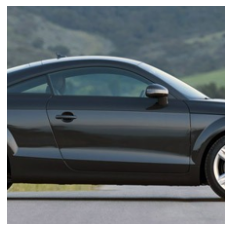

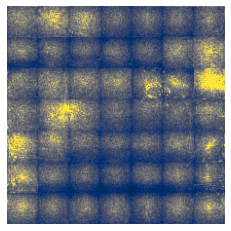

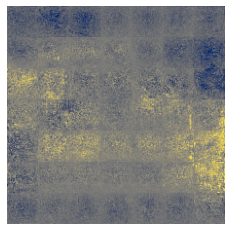

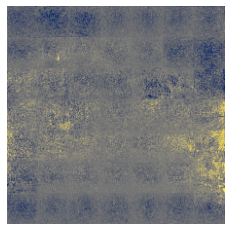

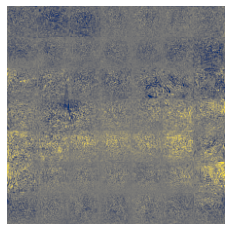

Processing ../data/cars196/car_ims/010468.jpg


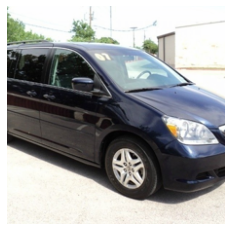

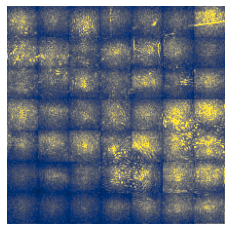

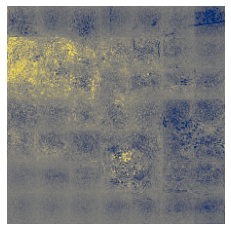

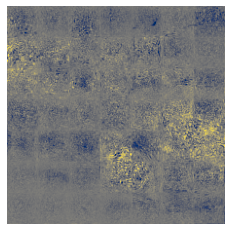

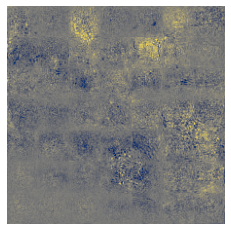

Processing ../data/cars196/car_ims/009910.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


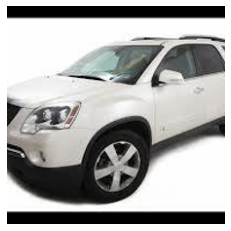

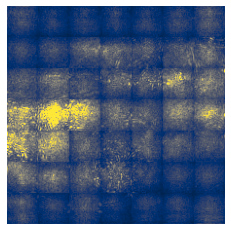

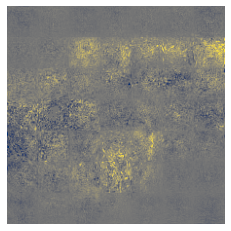

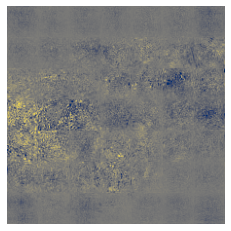

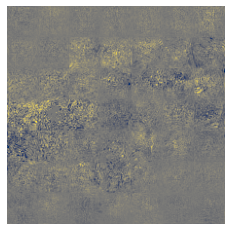

Processing ../data/cars196/car_ims/008400.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


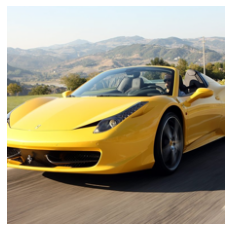

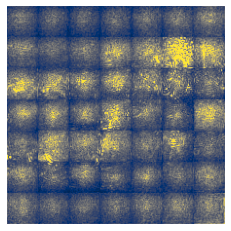

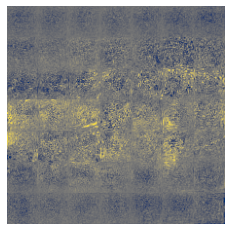

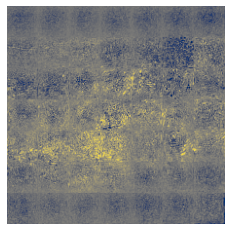

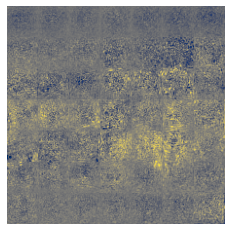

Processing ../data/cars196/car_ims/015408.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


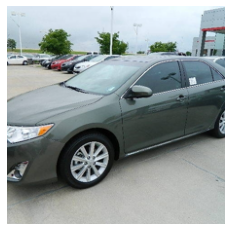

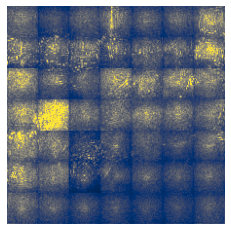

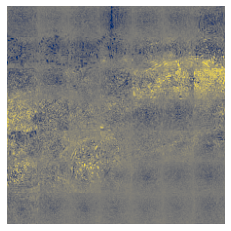

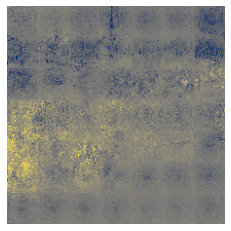

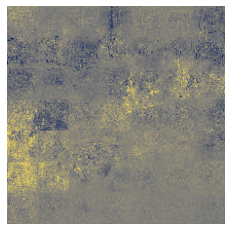

Processing ../data/cars196/car_ims/004578.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


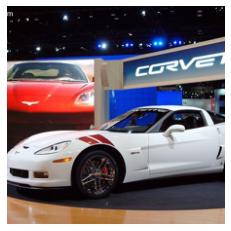

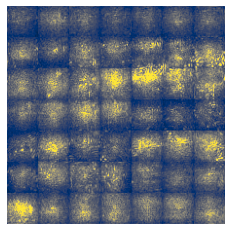

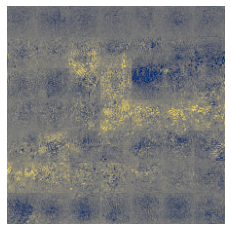

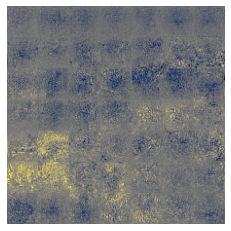

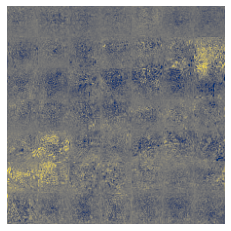

Processing ../data/cars196/car_ims/010189.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


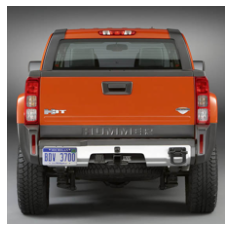

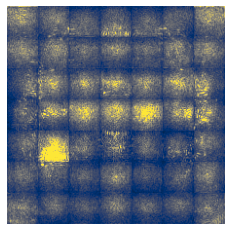

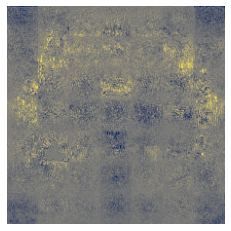

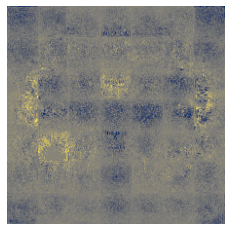

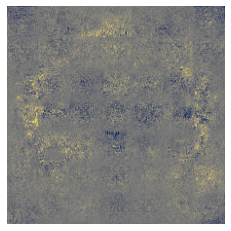

Processing ../data/cars196/car_ims/009112.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


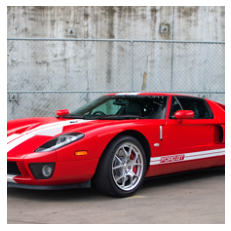

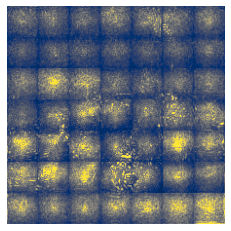

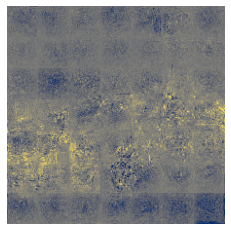

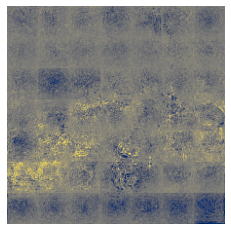

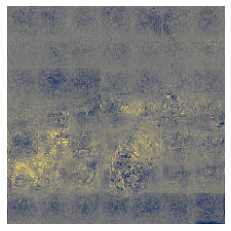

Processing ../data/cars196/car_ims/006091.jpg


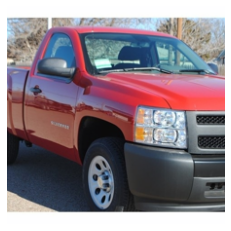

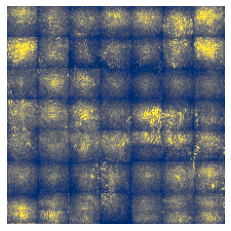

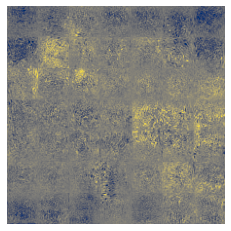

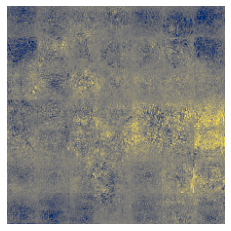

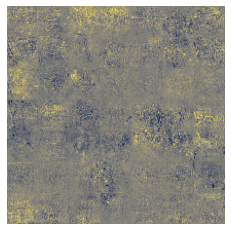

Processing ../data/cars196/car_ims/015126.jpg


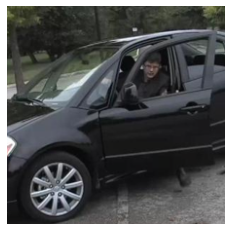

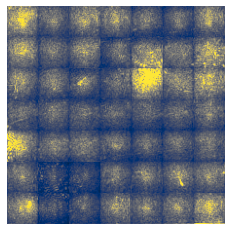

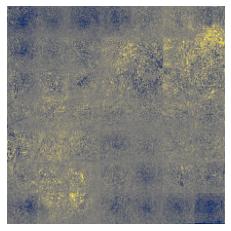

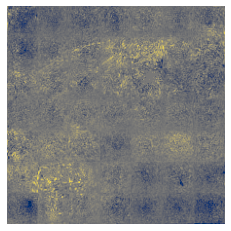

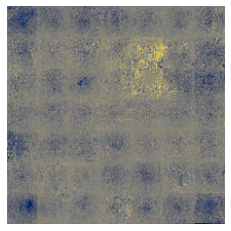

Processing ../data/cars196/car_ims/005296.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


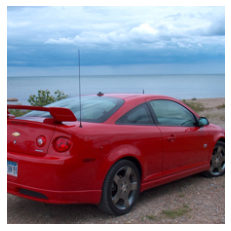

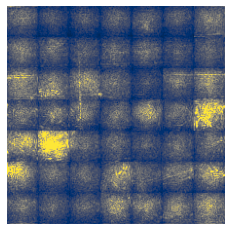

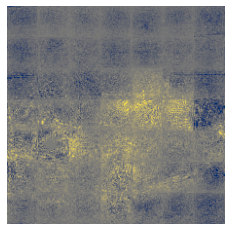

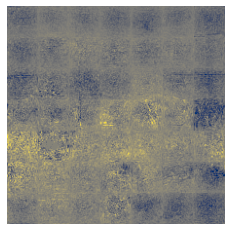

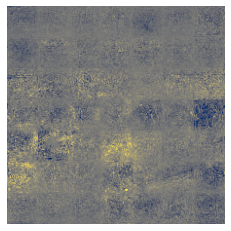

Processing ../data/cars196/car_ims/006937.jpg


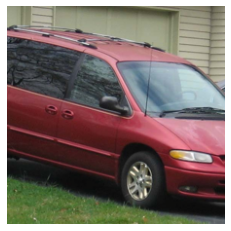

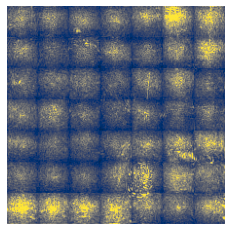

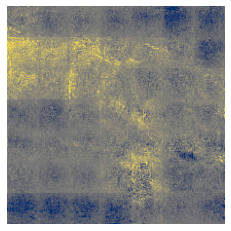

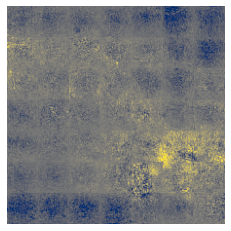

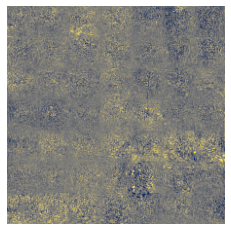

Processing ../data/cars196/car_ims/005803.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


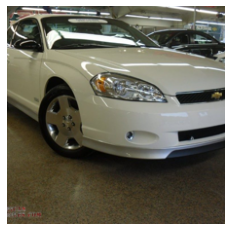

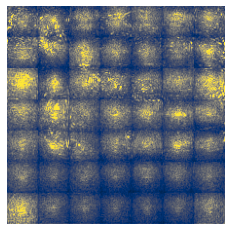

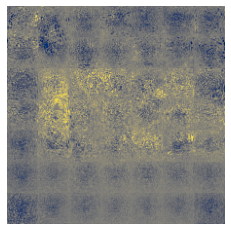

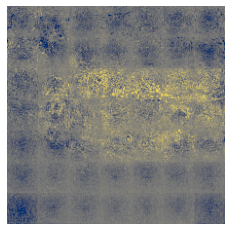

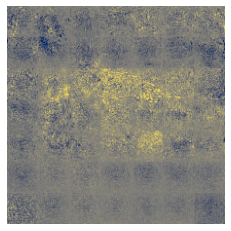

Processing ../data/cars196/car_ims/014967.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


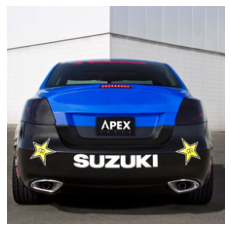

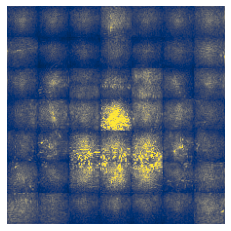

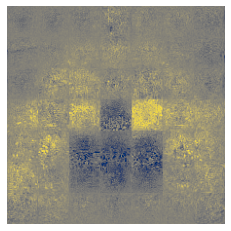

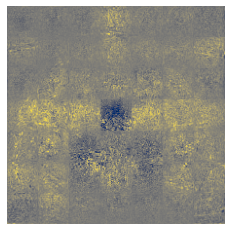

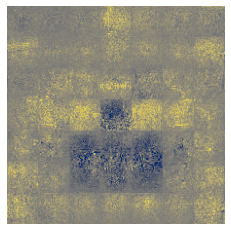

Processing ../data/cars196/car_ims/009705.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


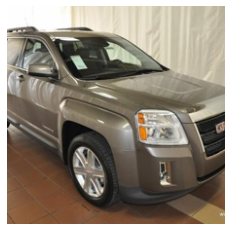

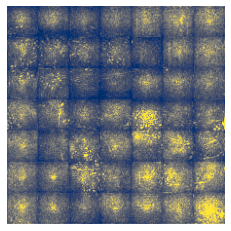

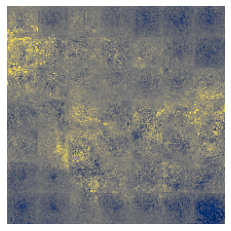

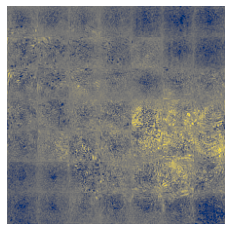

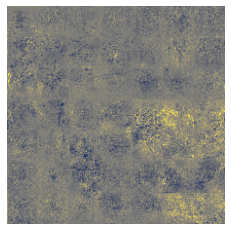

Processing ../data/cars196/car_ims/003320.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


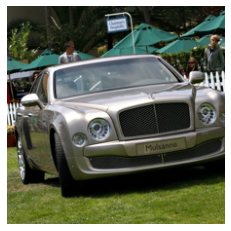

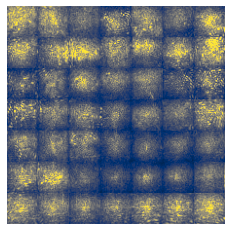

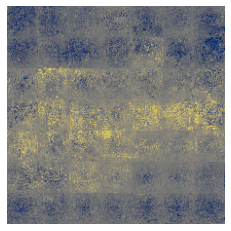

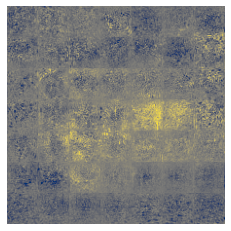

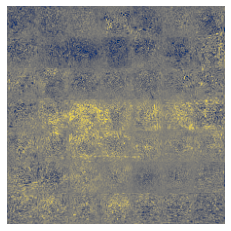

Processing ../data/cars196/car_ims/006519.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


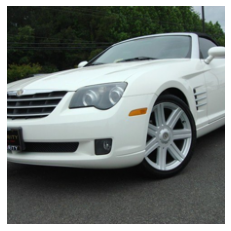

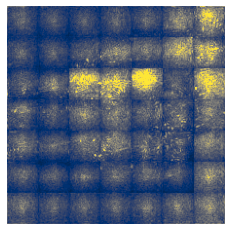

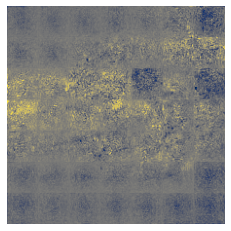

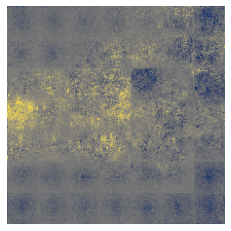

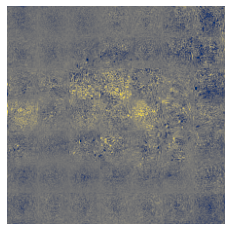

Processing ../data/cars196/car_ims/008886.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


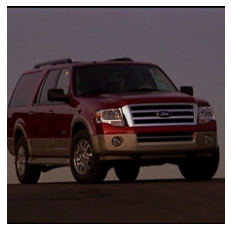

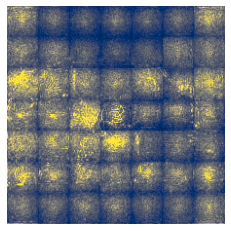

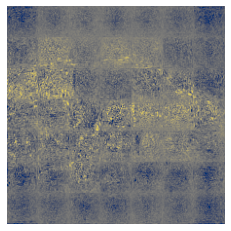

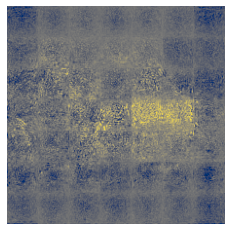

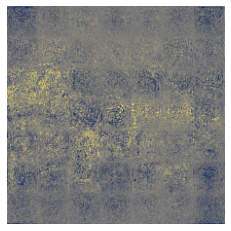

Processing ../data/cars196/car_ims/010343.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


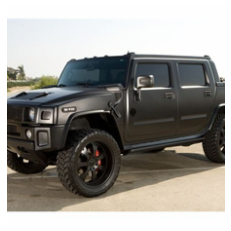

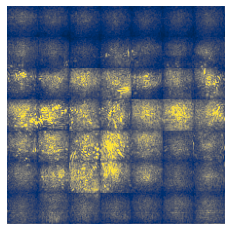

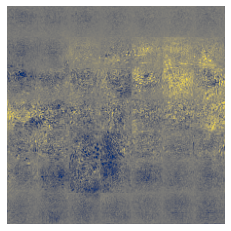

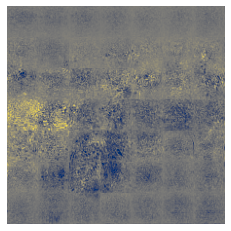

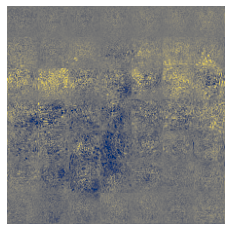

Processing ../data/cars196/car_ims/008009.jpg


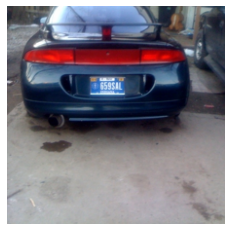

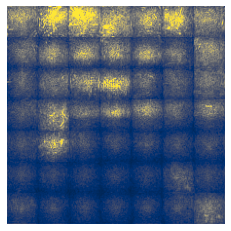

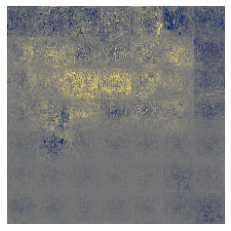

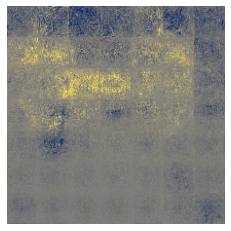

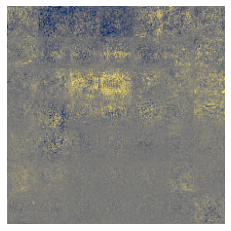

Processing ../data/cars196/car_ims/011777.jpg


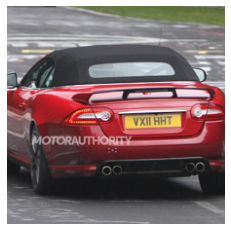

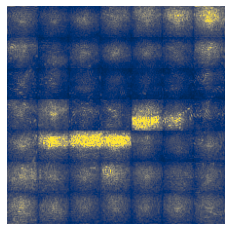

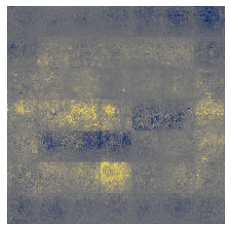

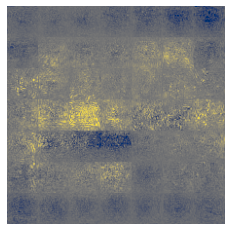

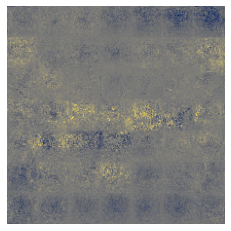

Processing ../data/cars196/car_ims/012899.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


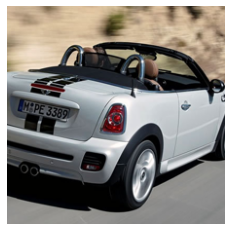

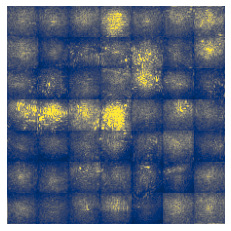

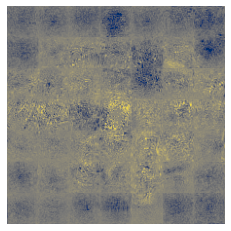

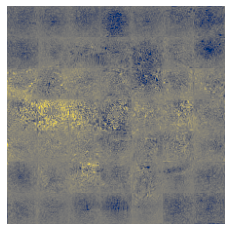

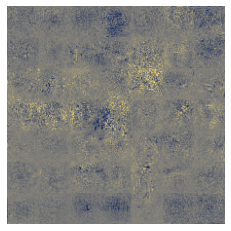

Processing ../data/cars196/car_ims/008446.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


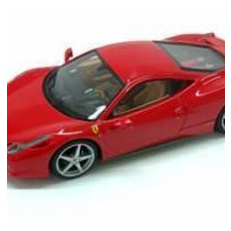

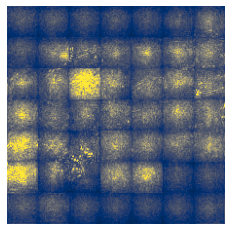

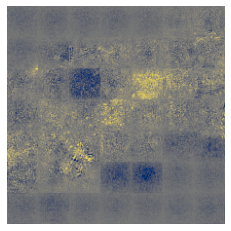

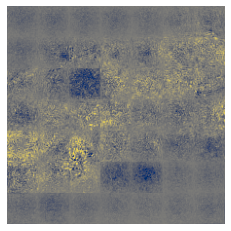

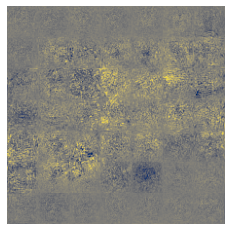

In [17]:
for f, input_img in zip(files, images):
    print(f"Processing {f}")
    file_id = f.split('/')[-1].split('.')[0]

    # Base CLIP
    img, clip_grads = clip_explainer.calc_grads(input_img)
    clip_grads = clip_explainer.process_grads(clip_grads)
    clip_explainer.visualize_img(img, save_path=f"./explainer_results/{file_id}_image.png")
    clip_explainer.visualize_grads(clip_grads, save_path=f"./explainer_results/{file_id}_CLIP.png")

    for name, explainer in [("Car Model", car_model_clip_explainer), ("Manufacturer", manufacturer_clip_explainer), ("Car Type", type_clip_explainer)]:
        _, grads = explainer.calc_grads(input_img)
        grads = explainer.process_grads(grads)

        # explainer.visualize_grads(grads - clip_grads, title=name, save_path=f"./explainer_results/{file_id}_{name}.png")
        explainer.visualize_grads(grads - clip_grads, save_path=f"./explainer_results/{file_id}_{name}.png")